In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import celltypist
from celltypist import models
import muon as mu
from muon import prot as pt

/data/msun/miniconda3/envs/CITE/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Filter out warnings to minimize clutter
import warnings
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)

In [3]:
import sys
sys.path.append('/data/msun/projects/Stephen/PDAC_scRNA/')
from core_functions.process_annotate import *

In [4]:
sc.settings.n_jobs = -1

# load data

In [76]:
mdata = mu.read('/data/msun/projects/Stephen/PDAC_scRNA/01_process_annnotate/citeseq_pdac.h5mu')

FileNotFoundError: [Errno 2] No such file or directory: 'Stephen/PDAC_scRNA/01_process_annnotate/annotated_citeseq_nospleen.h5mu'

In [6]:
non_spleen = mdata.obs['sample'] != 'Spleen control'
subset_data= mdata[non_spleen, :]

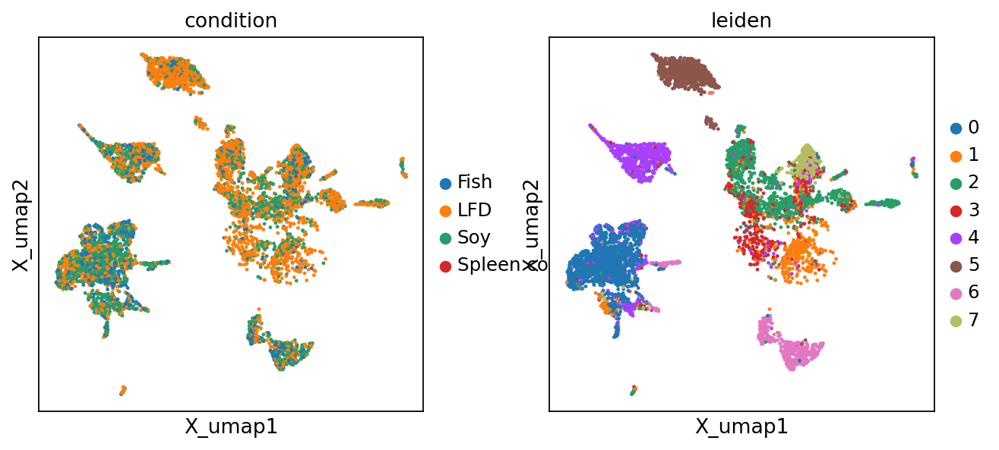

In [7]:
sc.set_figure_params(scanpy=True, fontsize=12)
mu.pl.embedding(subset_data, basis="rna:X_umap", color=['condition',  'leiden'])

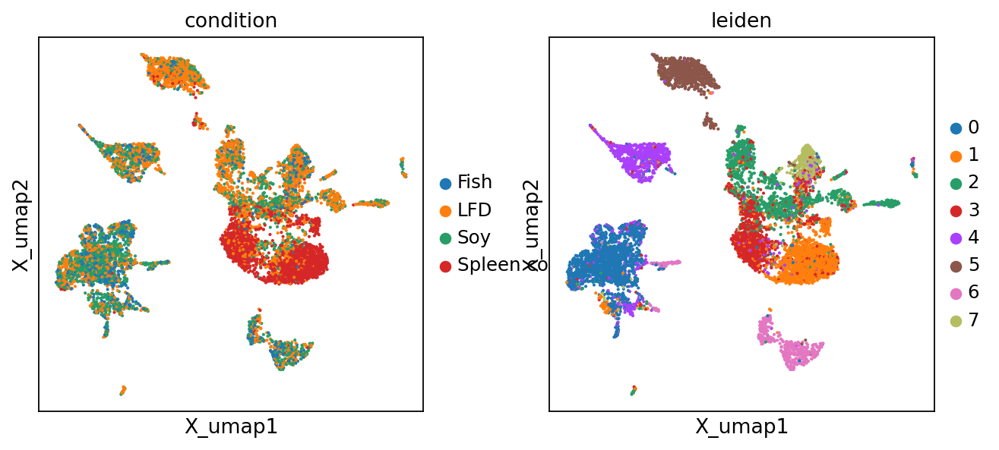

In [8]:
mu.pl.embedding(mdata, basis="rna:X_umap", color=['condition',  'leiden'])

In [9]:
rna = subset_data.mod['rna'].copy()

# Manual annotation

## Annotation with markers

In [10]:
#Subset the markers that were only detected in our data
marker_in_data = dict()
for ct, markers in PDAC_TME_markers.items():
    markers_found = list()
    for marker in markers:
        if marker in rna.var.index:
            markers_found.append(marker)
    if len(markers_found) != 0:
        marker_in_data[ct] = markers_found

T_CELLS:


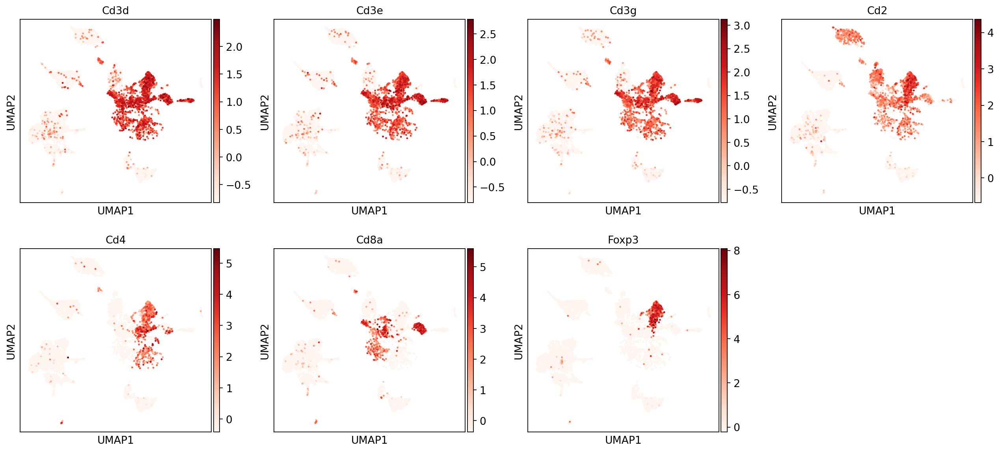





B_CELLS:


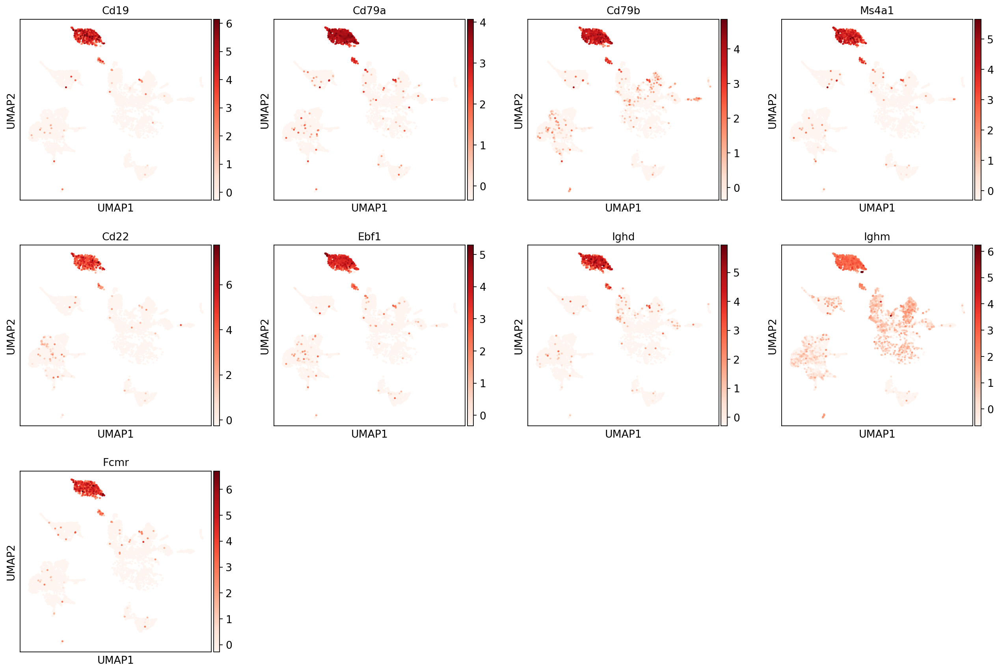





NK_CELLS:


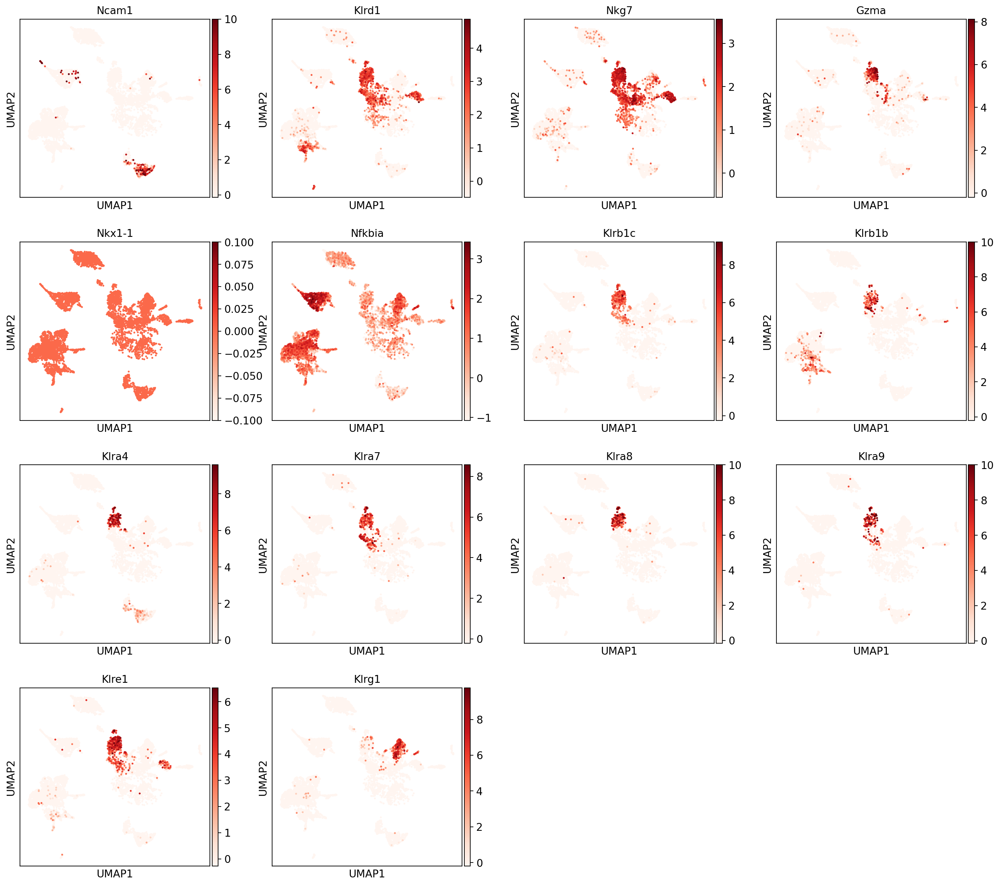





MONOCYTES:


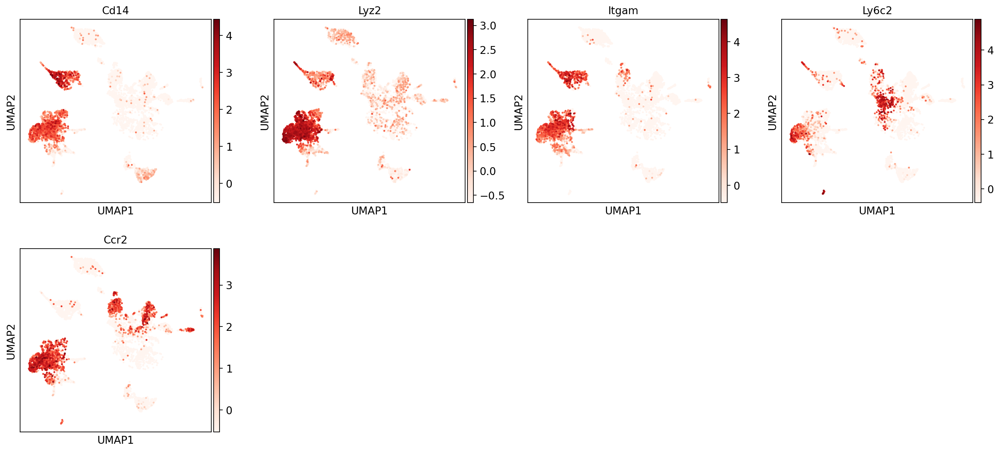





MACROPHAGES:


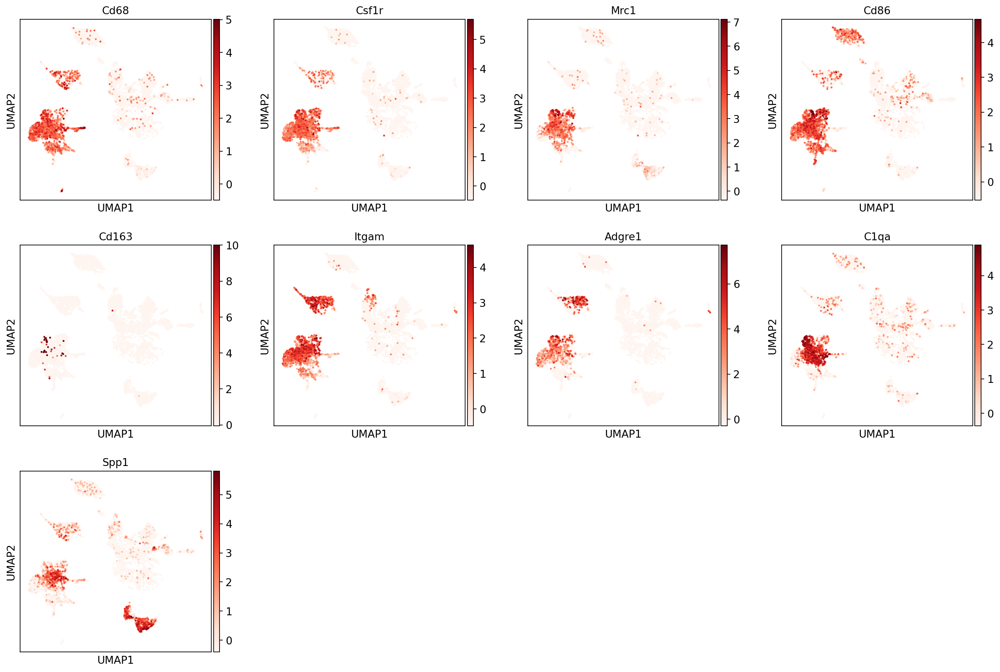





DENDRITIC_CELLS:


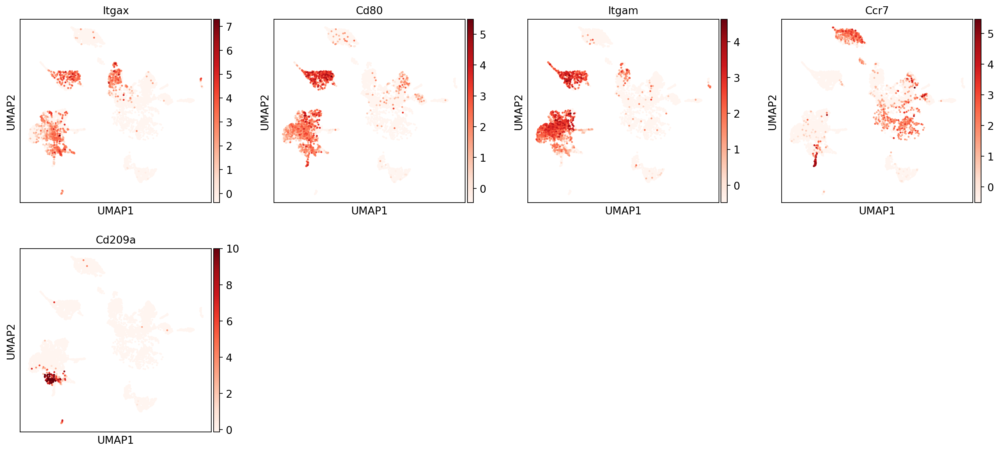





NEUTROPHILS:


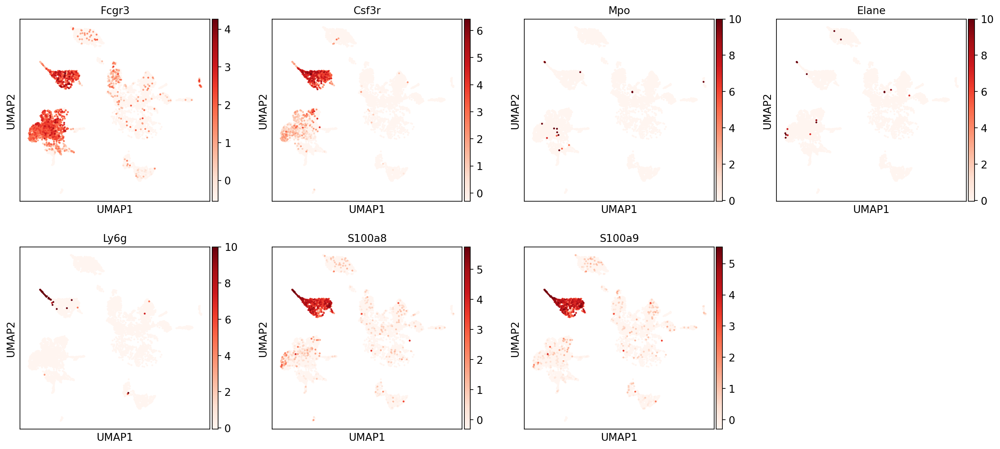





EPITHELIAL_CELLS:


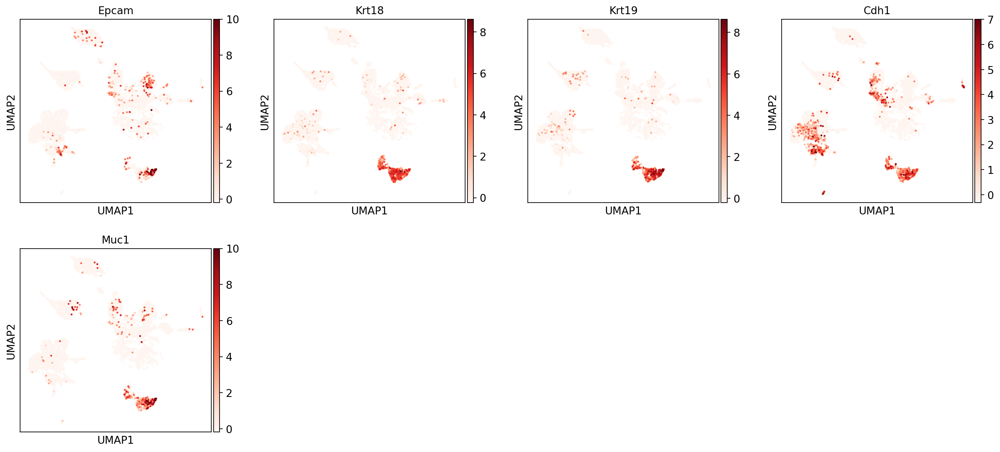





DUCTAL_CELLS:


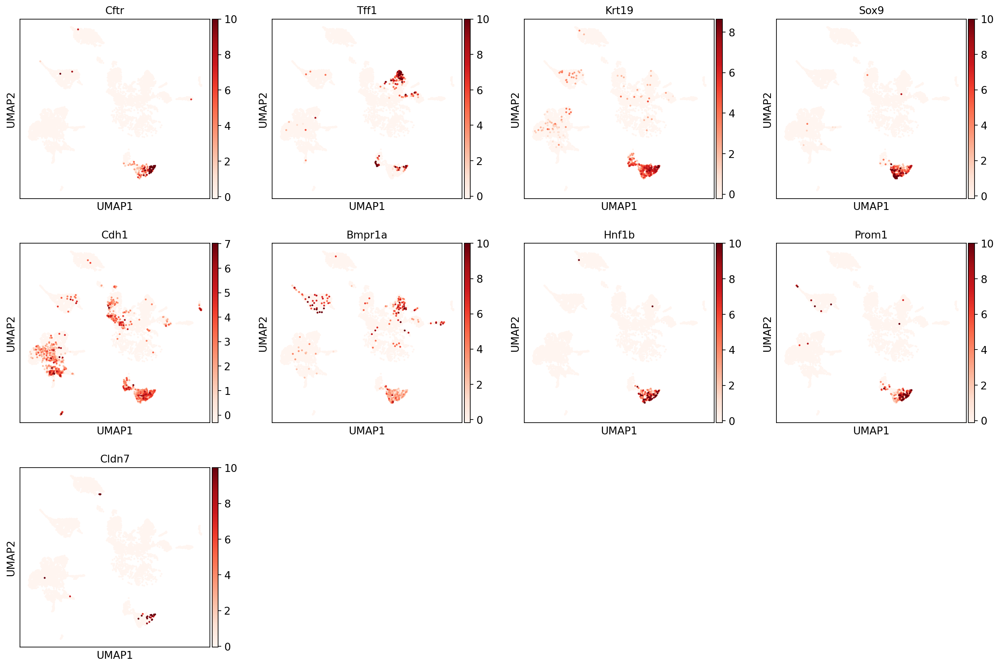





ENDOTHELIAL_CELLS:


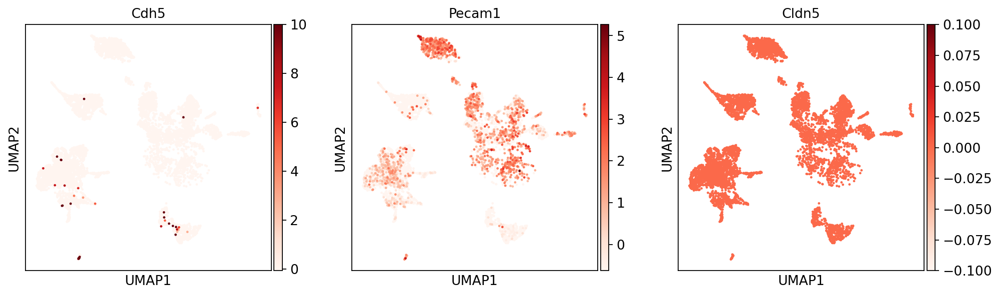





FIBROLAST:


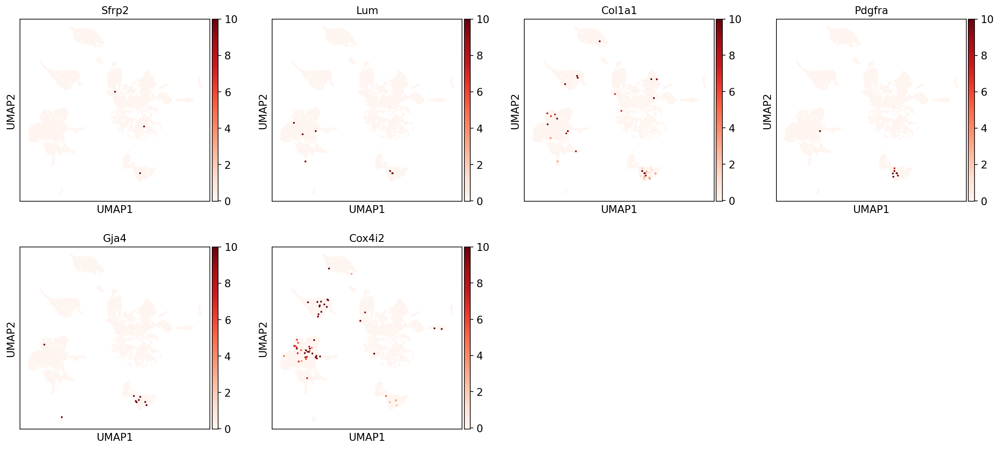





ACINAR_CELLS:


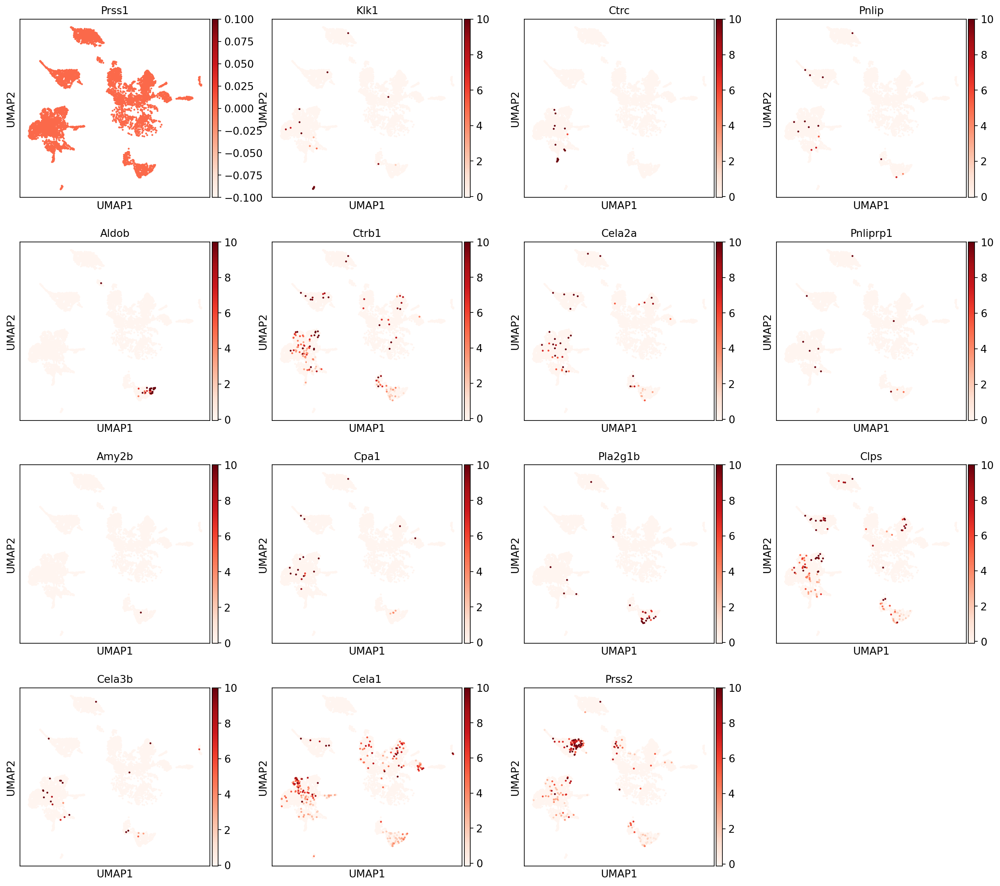





ALPHA_CELLS:


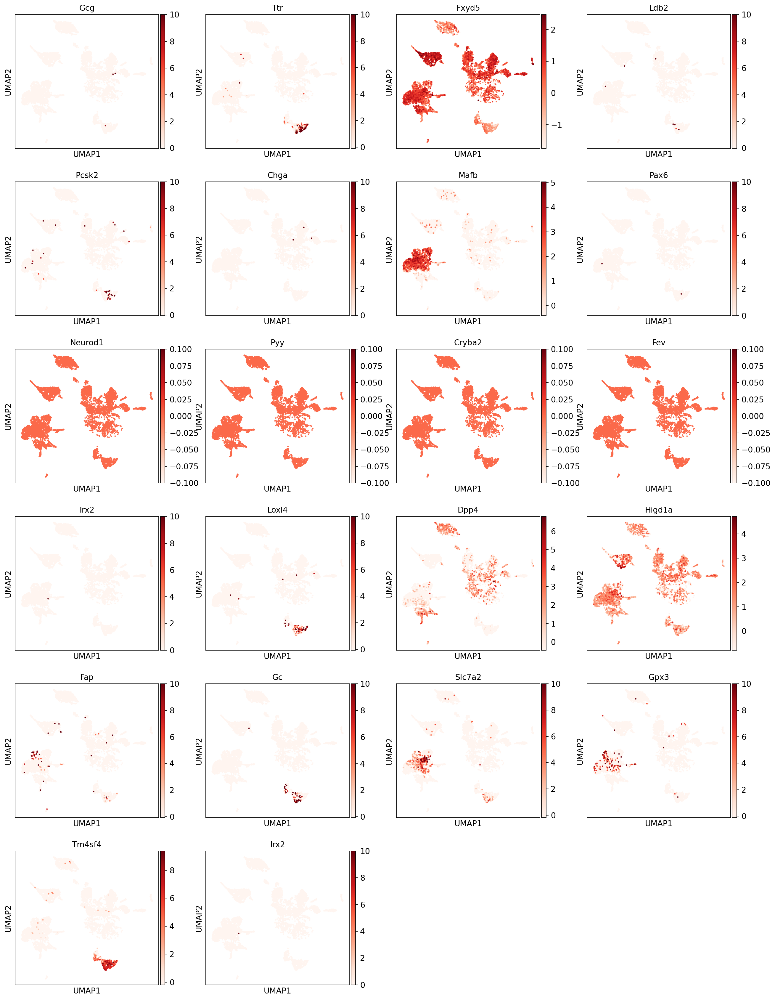





BETA_CELLS:


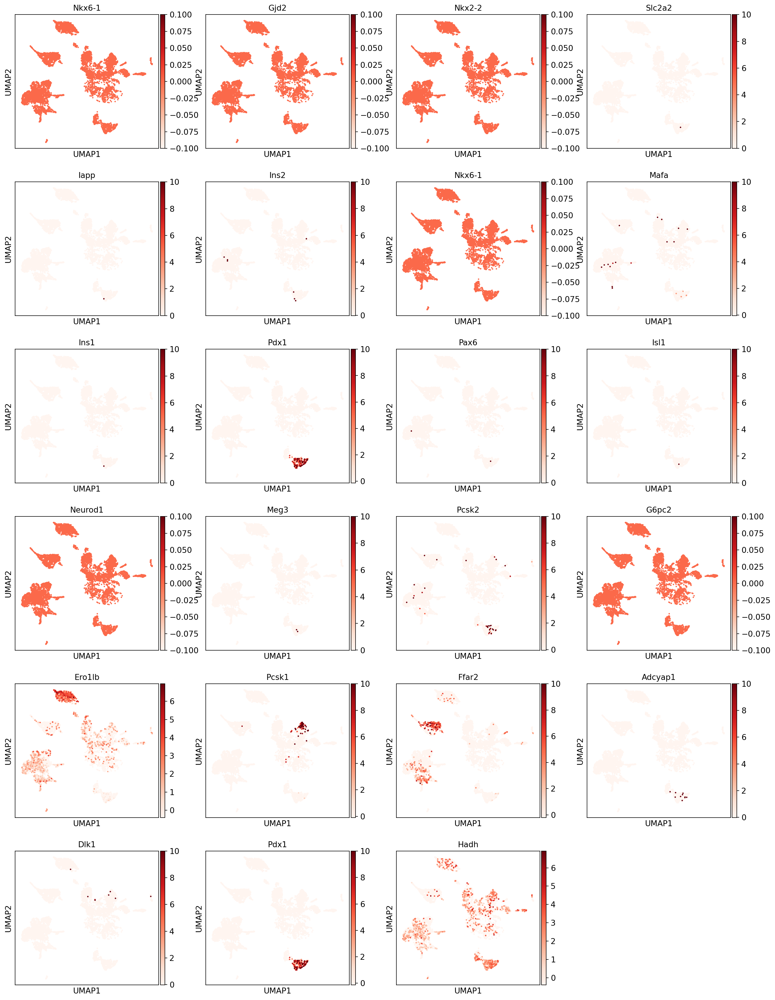





NEURONS:


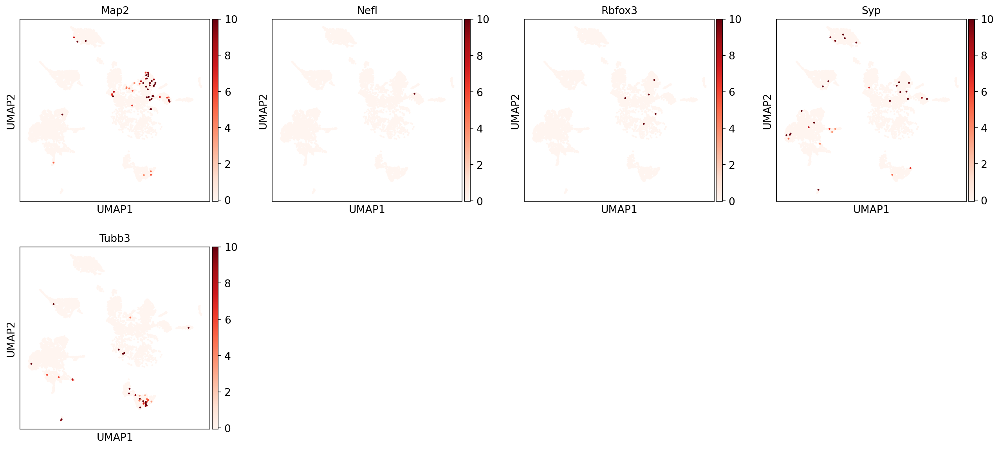

In [11]:
for ct in marker_in_data:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        rna,
        color=marker_in_data[ct],
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

In [12]:
sc.set_figure_params(scanpy=True, fontsize=24)

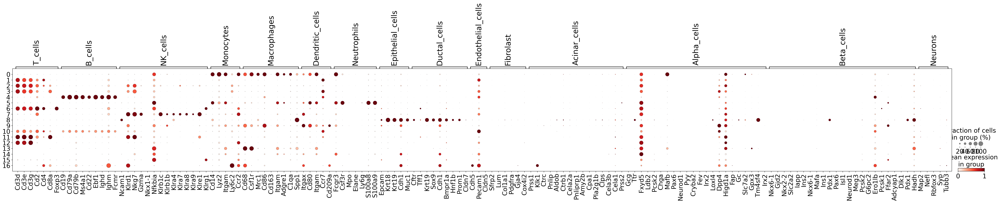

In [13]:
sc.pl.dotplot(
    rna,
    groupby="leiden_res0_25",
    var_names=marker_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

## Annotation with protein

In [14]:
variable_names = mdata.mod['prot'].var_names.tolist()
print(variable_names)

['B220', 'BST2.PDCA1.CD317', 'BTLA.CD272', 'CCR2.CD192', 'CCR4.CD194', 'CCR6', 'CCR7', 'CCR8', 'CD103', 'CD11A', 'CD120B', 'CD137', 'CD138', 'CD155.PVR', 'CD160', 'CD16_CD32', 'CD19', 'CD1D', 'CD2', 'CD20', 'CD200', 'CD200R', 'CD226.DNAM1', 'CD24', 'CD27', 'CD28', 'CD29', 'CD3', 'CD30', 'CD31', 'CD34', 'CD38', 'CD39', 'CD3E', 'CD4', 'CD43', 'CD44', 'CD45', 'CD45.1', 'CD45.2', 'CD45RB', 'CD48', 'CD49A', 'CD49B', 'CD5', 'CD55.DAF', 'CD61', 'CD62L', 'CD69', 'CD73.5NTD', 'CD80', 'CD81', 'CD83', 'CD86', 'CD8A', 'CD8B', 'CD9', 'CD94', 'CX3CR1', 'CXCR2', 'CXCR3', 'CXCR5', 'CXCR6.CD186', 'F480', 'FAS.CD95', 'FASL.CD178', 'FCERA', 'FR4', 'GITR.CD357', 'GR1_LY6G_LY6C1_LY6C2', 'HAVCR2', 'HT10', 'HT11', 'HT12', 'HT13', 'HT14', 'HT15', 'HT16', 'HT17', 'HT18', 'HT19', 'HT20', 'HT21', 'HT22', 'HT23', 'HT24', 'HT8', 'HT9', 'HVEM.CD270', 'I.A_I.E', 'ICAM1', 'ICOS.CD278', 'IL1RL1.ST2', 'IL21R', 'IL2RA.CD25', 'IL2RB.CD122', 'IL4RA.CD124', 'IL7RA.CD127', 'ITA4.CD49D', 'ITA6.CD49F', 'ITAM.CD11B', 'ITAX.CD1

In [15]:
#Subset the markers that were only detected in our data
marker_in_data = dict()
for ct, markers in PDAC_TME_protein.items():
    markers_found = list()
    for marker in markers:
        if marker in variable_names:
            markers_found.append(marker)
    if len(markers_found) != 0:
        marker_in_data[ct] = markers_found

B CELLS:


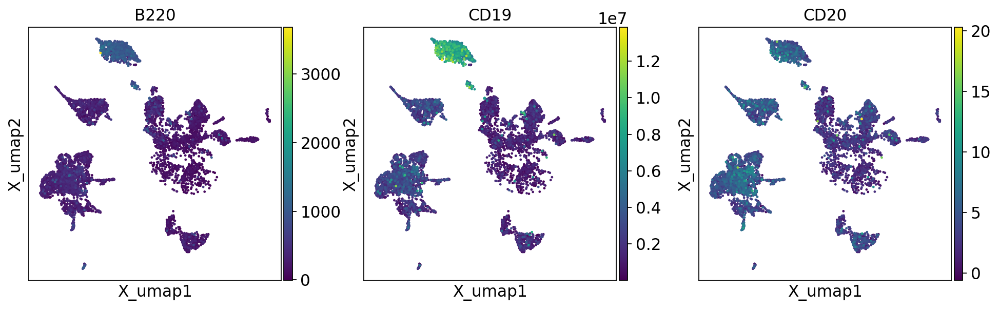





T CELLS:


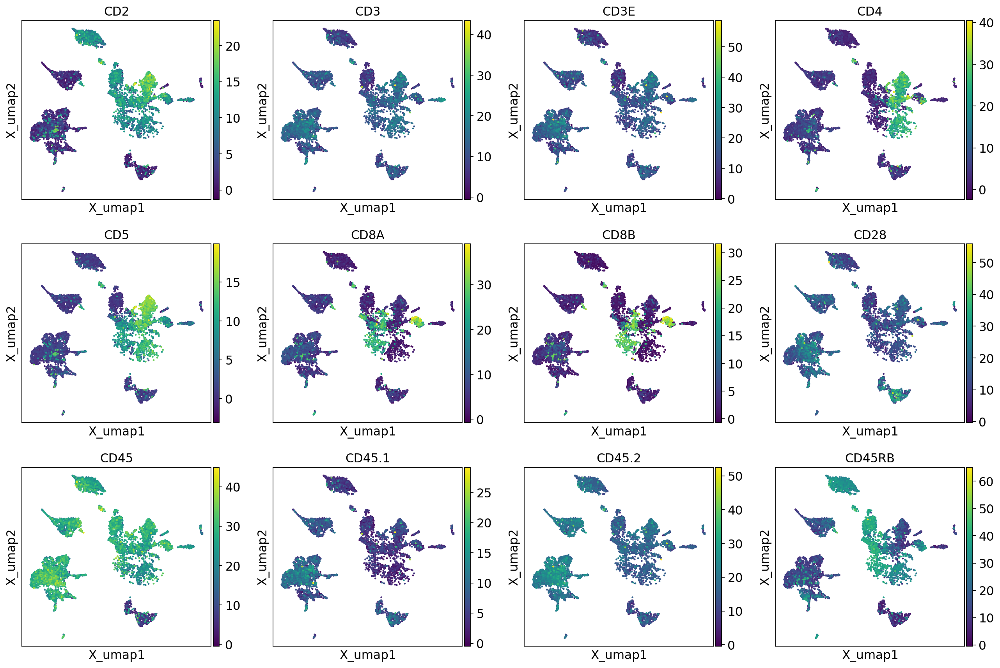





TREGS:


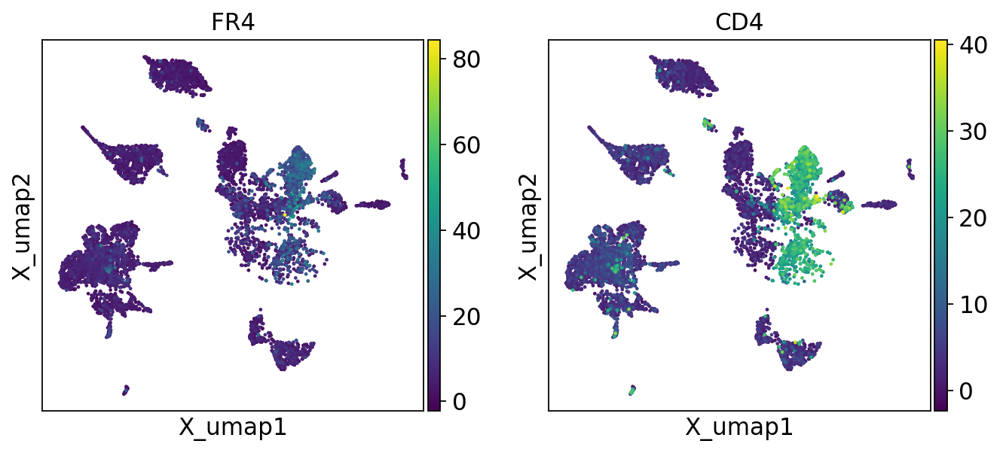





NK CELLS:


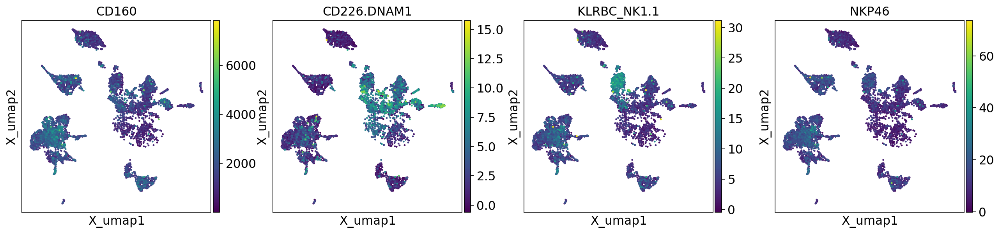





MONOCYTES/MACROPHAGES:


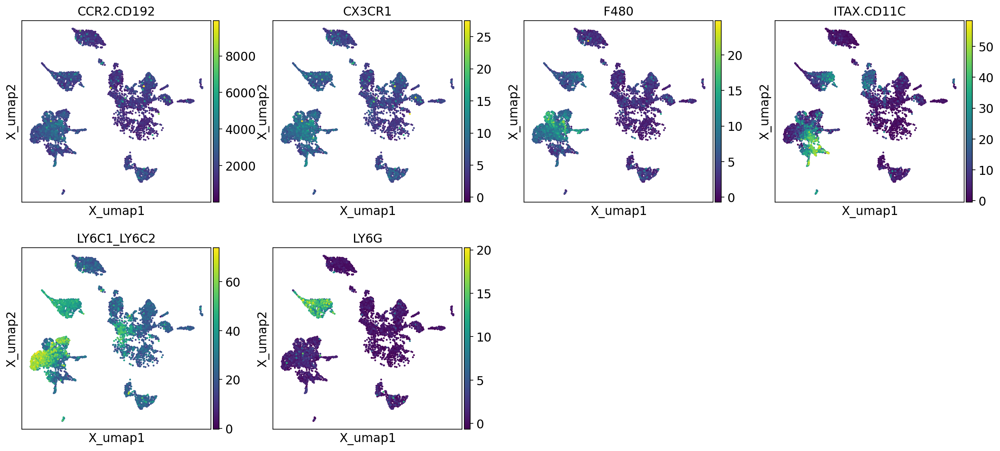





DENDRITIC CELLS:


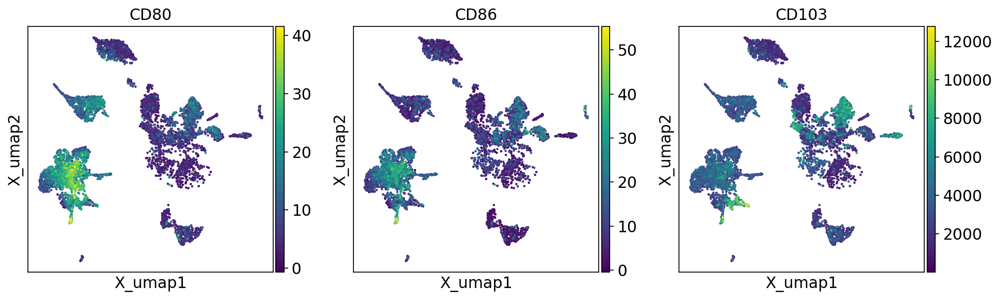





NEUTROPHILS:


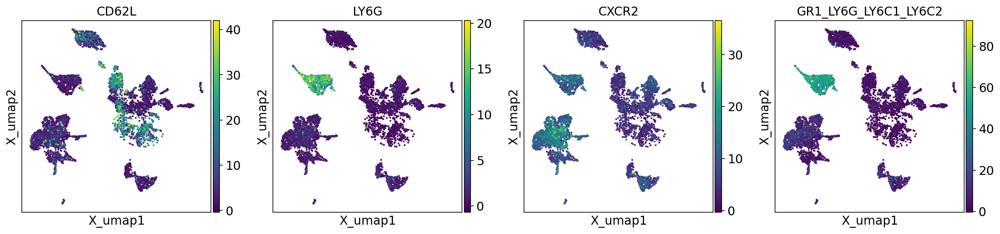

In [16]:
sc.set_figure_params(scanpy=True, fontsize=14)
for ct in PDAC_TME_protein:
    print(f"{ct.upper()}:")  # print cell subtype name
    mu.pl.embedding(
        subset_data, 
        basis="rna:X_umap", 
        color=marker_in_data[ct]
    )
    print("\n\n\n")  # print white space for legibility

In [80]:
mdata.mod["prot"].obs["leiden_res0_25"] = mdata.mod["rna"].obs["leiden_res0_25"]

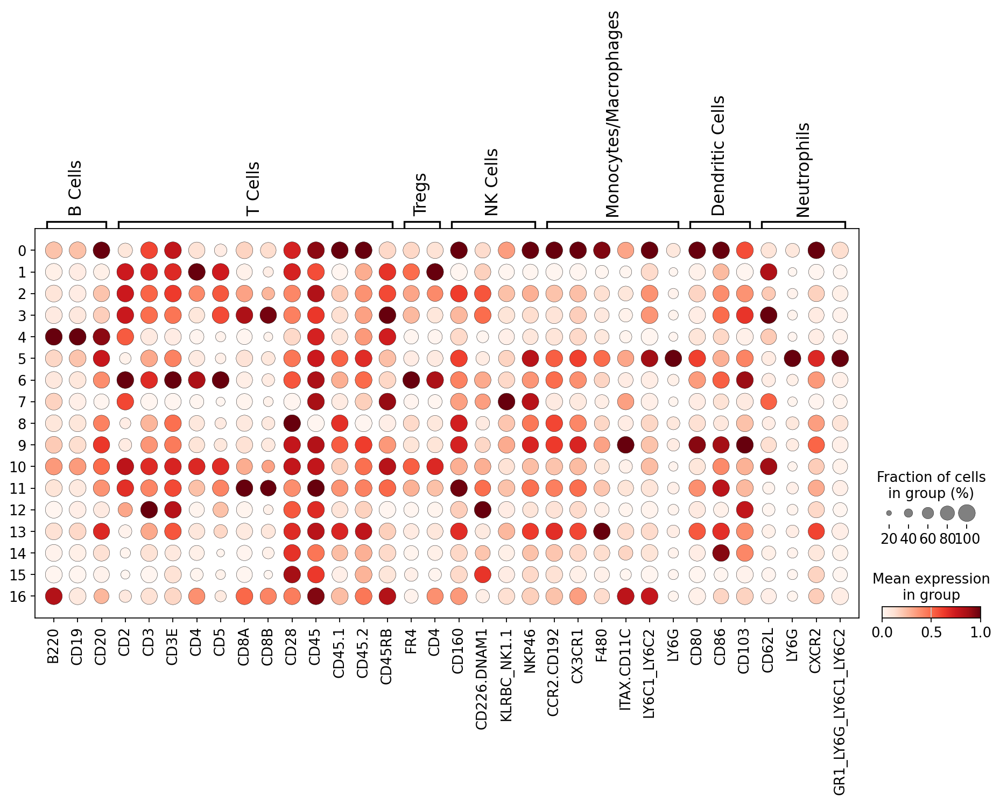

In [81]:
sc.pl.dotplot(
    mdata.mod['prot'],
    groupby="leiden_res0_25",
    var_names=marker_in_data,
    standard_scale="var",  
)

## Annotation with DEG

In [17]:
sc.tl.rank_genes_groups(
    rna, groupby="leiden_res0_25", method="wilcoxon", key_added="DEG_leiden_res0_25",
)

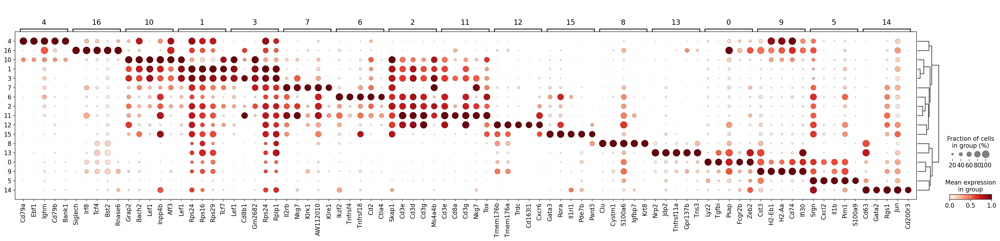

In [18]:
sc.pl.rank_genes_groups_dotplot(
    rna, groupby="leiden_res0_25", standard_scale="var", n_genes=5, key="DEG_leiden_res0_25"
)

In [19]:
result = rna.uns['DEG_leiden_res0_25']
groups = result['names'].dtype.names
degs = pd.DataFrame(
    {group + '_' + key: result[key][group] for group in groups for key in ['names', 'scores', 'logfoldchanges', 'pvals', 'pvals_adj']}
)
degs.to_csv('/data/msun/projects/Stephen/PDAC_scRNA/01_process_annnotate/markers_res0.25.csv')

# Automated annotation

In [47]:
rna_celltypist = rna.copy()  # make a copy of our rna
rna_celltypist.X = rna.layers["counts"]  # set rna.X to raw counts
sc.pp.normalize_per_cell(
    rna_celltypist, counts_per_cell_after=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(rna_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
rna_celltypist.X = rna_celltypist.X.toarray()

In [48]:
models.download_models(
    force_update=True, model=["Immune_All_High.pkl"]
)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 50
📂 Storing models in /home/msun/.celltypist/data/models
💾 Total models to download: 1
💾 Downloading model [1/1]: Immune_All_High.pkl


In [49]:
model_high = celltypist.Model.load('Immune_All_High.pkl')
model_high.convert()
model_high.write('mouse_immune_model.pkl')

🧬 Number of genes in the original model: 6639
✅ Conversion done! Number of genes in the converted model: 4760


In [50]:
predictions_high = celltypist.annotate(
    rna_celltypist, model='mouse_immune_model.pkl', majority_voting=True
)

🔬 Input data has 6547 cells and 55487 genes
🔗 Matching reference genes in the model
🧬 4752 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [52]:
predictions_high_rna = predictions_high.to_adata()

In [55]:
models.download_models(
    force_update=True, model=["Immune_All_Low.pkl"]
)
model_low = celltypist.Model.load('Immune_All_Low.pkl')
model_low.convert()
model_low.write('mouse_immune_model.pkl')
predictions_low = celltypist.annotate(
    rna_celltypist, model='mouse_immune_model.pkl', majority_voting=True
)
predictions_low_rna = predictions_low.to_adata()

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 50
📂 Storing models in /home/msun/.celltypist/data/models
💾 Total models to download: 1
💾 Downloading model [1/1]: Immune_All_Low.pkl
🧬 Number of genes in the original model: 6639
✅ Conversion done! Number of genes in the converted model: 4760
🔬 Input data has 6547 cells and 55487 genes
🔗 Matching reference genes in the model
🧬 4752 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [53]:
rna.obs["celltypist_cell_label_coarse"] = predictions_high_rna.obs.loc[
    rna.obs.index, "majority_voting"
]
rna.obs["celltypist_conf_score_coarse"] = predictions_high_rna.obs.loc[
    rna.obs.index, "conf_score"
]

In [56]:
rna.obs["celltypist_cell_label_fine"] = predictions_low_rna.obs.loc[
    rna.obs.index, "majority_voting"
]
rna.obs["celltypist_conf_score_fine"] = predictions_low_rna.obs.loc[
    rna.obs.index, "conf_score"
]

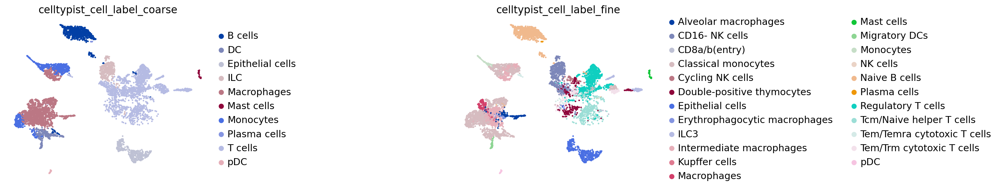

In [57]:
sc.pl.umap(
    rna,
    color=["celltypist_cell_label_coarse", "celltypist_cell_label_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

# final annotation

In [58]:
fl_annotation = {
    "1": "Myeloid_cells",
    "8": "Myeloid_cells",
    "10": "DC",
    "20": "DC",
    "18": "Myeloid_cells",
    "12": "Myeloid_cells",
    "15": "Tumor_cells",
    "11": "Tumor_cells",
    "4": "Neutrophils",
    "25": "Neutrophils",
    "19": "B_cells",
    "3": "B_cells",
    "6": "NK_cells",
    "21": "NK_cells",
    "14": "CD4T_cells",
    "0": "CD4T_cells",
    "7": "CD4T_cells",
    "5": "Tregs",
    "2": "CD8T_cells",
    "9": "CD8T_cells",
    "17": "CD8T_cells",
    "13": "CD8T_cells",
    "23": "Innate_lymphoid_cells",
    "16": "Innate_lymphoid_cells",
    "24": "pDC",
    "22": "Mast_cells"
}

In [59]:
rna.obs["celltype_V1"] = rna.obs.leiden_res0_75.map(fl_annotation)

In [68]:
mask = (rna.obs['celltypist_cell_label_fine'] == 'Tem/Trm cytotoxic T cells') & (rna.obs['leiden_res0_75'] == '7')
rna.obs.loc[mask, 'celltype_V1'] = 'CD8T_cells'

In [69]:
mask = (rna.obs['celltypist_cell_label_fine'] == 'Regulatory T cells') & (rna.obs['leiden_res0_75'] == '17')
rna.obs.loc[mask, 'celltype_V1'] = 'CD4T_cells'

In [70]:
mask = (rna.obs['celltypist_cell_label_fine'] == 'Tem/Trm cytotoxic T cells') & (rna.obs['leiden_res0_75'] == '13')
rna.obs.loc[mask, 'celltype_V1'] = 'CD4T_cells'

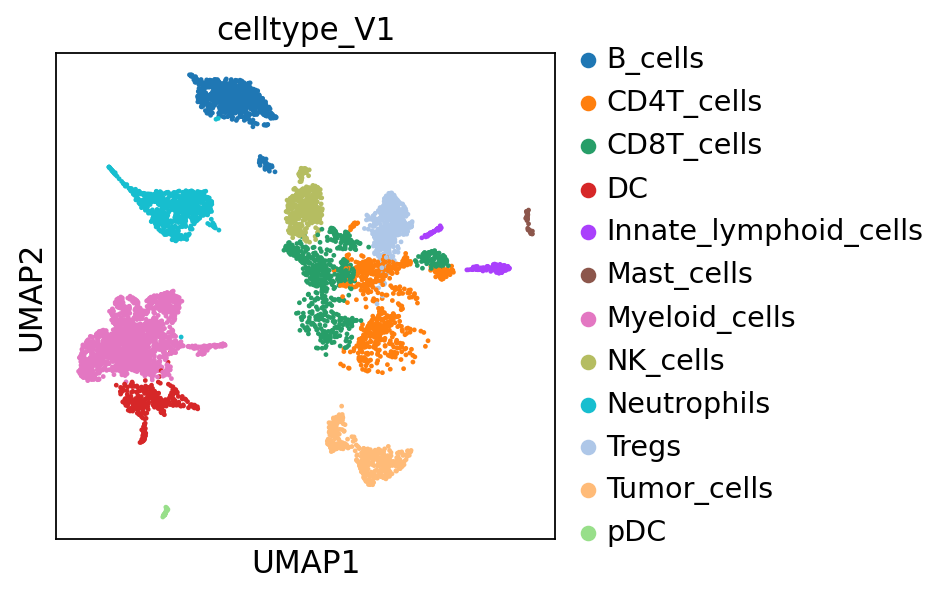

In [71]:
sc.pl.umap(rna, color=["celltype_V1"])

In [72]:
subset_data.mod['rna'] = rna

In [73]:
subset_data.update()
subset_data.write("/data/msun/projects/Stephen/PDAC_scRNA/01_process_annnotate/annotated_citeseq_nospleen.h5mu")

/data/msun/miniconda3/envs/CITE/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[key] = c
... storing 'feature_types' as categorical


In [74]:
subset_data

MuData object with n_obs × n_vars = 6547 × 55632
  obs:	'HT1', 'HT2', 'HT3', 'HT4', 'HT5', 'HT6', 'HT7', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'sample', 'condition', 'leiden'
  var:	'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
  obsm:	'X_mofa', 'X_umap', 'X_umap_mofa'
  varm:	'LFs'
  obsp:	'connectivities', 'distances'
  2 modalities
    rna:	6547 x 55487
      obs:	'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res0_75', 'leiden_res1', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltype_V1', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
      var:	'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
      uns:	'hvg', 'leiden_colors', 'leiden_res0_25', 'leiden_res0_25_colors', 'leiden_res0_5', 'leiden_res0_5_colors', 'leiden_res0_75', 'leiden_res0_75_colors', 'leiden_res1', 'leiden_res1_colors', 'log1p', 'neighbors', 'pca', 'umap', 'condition_colors', 'DEG_leiden_res0_25', 'dendrogram_leiden_res0_25', 'celltypist_cell_label_coarse_colors', 'celltype_V1_colors', 'celltypist_cell_label_fine_colors'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts', 'log1p_norm', 'magiced', 'scaled'
      obsp:	'connectivities', 'distances'
    prot:	6547 x 145
      obs:	'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'doublets_markers'
      var:	'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
      uns:	'Classification_colors', 'doublets_markers_colors', 'leiden_colors', 'neighbors', 'pca', 'umap'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'

In [78]:
rna.write("/data/msun/projects/Stephen/PDAC_scRNA/01_process_annnotate/annotated_rna_nospleen.h5ad")